# Data Augmentation

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from os.path import join
import Augmentor
from Augmentor.Operations import Operation
import cv2
from PIL import Image


from cancer.variables import CANCER_DATA_DIR, SIPAKMED_DATA_DIR
from cancer.visulize import show_image
from cancer.utils import read_png
from cancer.augment import randomly_insert_cells

In [3]:
from matplotlib import pyplot as plt

In [4]:
img_path = join(CANCER_DATA_DIR, 'SIPaKMeD', 'processed_data','full_slide_classification',
                'normal', 'images', 'superficial-intermediate004.png')
img = Image.open(img_path)

In [38]:
def try_operation(op, num_samples=1):
    return operation.perform_operation([img]*num_samples)

In [39]:
try_operation(Augmentor.Operations.CropRandom(probability=1, percentage_area=.9))

[<PIL.Image.Image image mode=RGB size=921x921 at 0x139E55EB8>]

In [28]:
Augmentor.Operations.RandomBrightness

In [ ]:
RandomBrightness, RandomColor, RandomContrast, RandomErasing, ZoomRandom

### Helpers

In [260]:
def get_aug_image(pipline):
    gen = pipeline.keras_generator(batch_size=4, scaled=False)
    return next(gen)[0]

In [261]:
def compare_augment(orig, augm_list):
    plt.figure(figsize=(20,20))
    orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    plt.subplot(151)
    plt.imshow(orig)
    plt.axis('off')
    for i in range(4):
        augm = augm_list[i].squeeze()
        #augm = cv2.cvtColor(augm, cv2.COLOR_BGR2RGB)
        plt.subplot(1,5,i+2)
        plt.imshow(augm)
        plt.axis('off')

    plt.show()

In [262]:
def save_augment(orid_img, aug_img, aug_name):
    save_dir = join(data_path, '..', 'augmentation_examples')
    Image.fromarray(orig_img).save(join(save_dir, f'{aug_name}_orig.png'))
    for i in range(4):
        Image.fromarray(aug_img[i].squeeze()).save(join(save_dir, f'{aug_name}_aug{i+1}.png'))
    print('saved images.')

## Rotation

In [187]:
pipeline = Augmentor.Pipeline(data_path)
pipeline.flip_left_right(probability=.5)
pipeline.flip_top_bottom(probability=.5)

pipeline.rotate(probability=1, max_left_rotation=25, max_right_rotation=25)

Initialised with 1 image(s) found.
Output directory set to /Users/seanwade/projects/cancerDetection/data/../notebooks/resources/output.

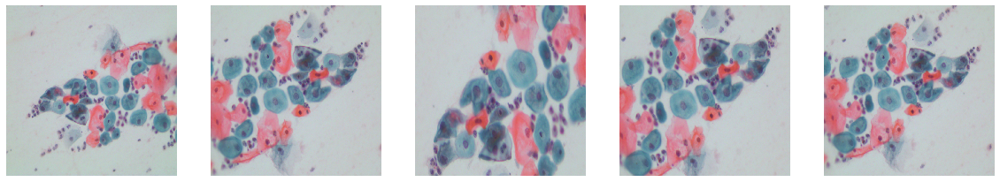

In [195]:
aug_img = get_aug_image(pipeline)
compare_augment(orig_img, aug_img)

In [198]:
save_augment(orig_img, aug_img, 'rotate')

saved images.


## Zoom

Initialised with 1 image(s) found.
Output directory set to /Users/seanwade/projects/cancerDetection/data/../notebooks/resources/output.

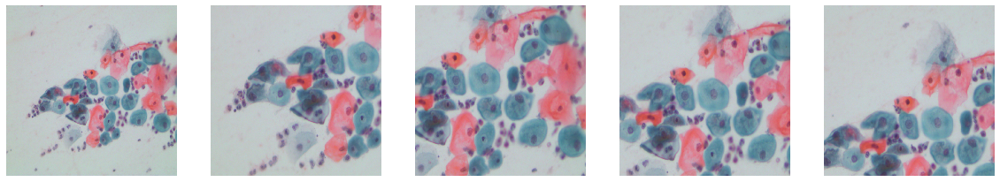

In [199]:
pipeline = Augmentor.Pipeline(data_path)
pipeline.zoom_random(probability=1, percentage_area=0.6)

aug_img = get_aug_image(pipeline)
compare_augment(orig_img, aug_img)

In [200]:
save_augment(orig_img, aug_img, 'zoom')

saved images.


## Elastic Deformation

Initialised with 1 image(s) found.
Output directory set to /Users/seanwade/projects/cancerDetection/data/../notebooks/resources/output.

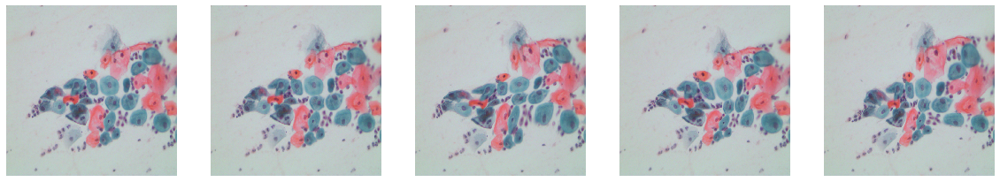

In [209]:
pipeline = Augmentor.Pipeline(data_path)
pipeline.random_distortion(probability=.3, grid_width=5, grid_height=5, magnitude=50)

aug_img = get_aug_image(pipeline)
compare_augment(orig_img, aug_img)

In [210]:
save_augment(orig_img, aug_img, 'elastic_deformation')

saved images.


## Random Crop

Initialised with 1 image(s) found.
Output directory set to /Users/seanwade/projects/cancerDetection/data/../notebooks/resources/output.

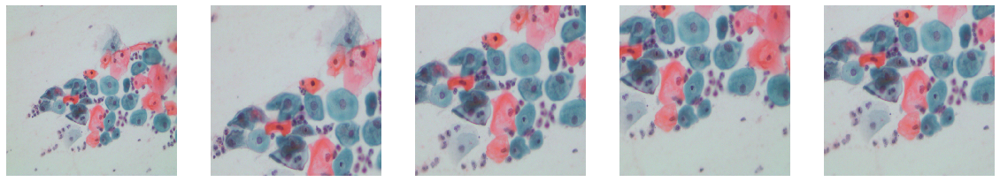

In [211]:
pipeline = Augmentor.Pipeline(data_path)
pipeline.crop_random(1, .6)

aug_img = get_aug_image(pipeline)
compare_augment(orig_img, aug_img)

In [212]:
save_augment(orig_img, aug_img, 'random_crop')

saved images.


## Flip

Initialised with 1 image(s) found.
Output directory set to /Users/seanwade/projects/cancerDetection/data/../notebooks/resources/output.

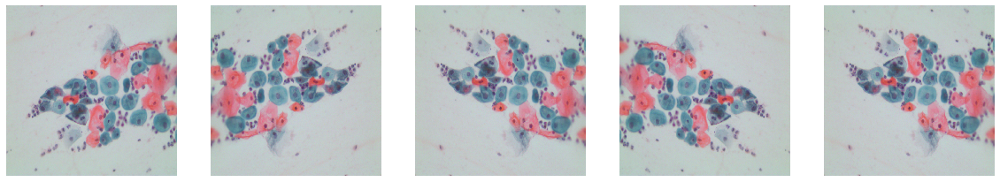

In [216]:
pipeline = Augmentor.Pipeline(data_path)
pipeline.flip_left_right(probability=0.5)
pipeline.flip_top_bottom(probability=0.5)

aug_img = get_aug_image(pipeline)
compare_augment(orig_img, aug_img)

In [217]:
save_augment(orig_img, aug_img, 'flip')

saved images.


## Histogram Equalization

In [268]:
import Augmentor

Augmentor.Operations.HistogramEqualisation(1).perform_operation(orig_img)

AttributeError: 'numpy.ndarray' object has no attribute 'mode'

Initialised with 1 image(s) found.
Output directory set to /Users/seanwade/projects/cancerDetection/data/../notebooks/resources/output.

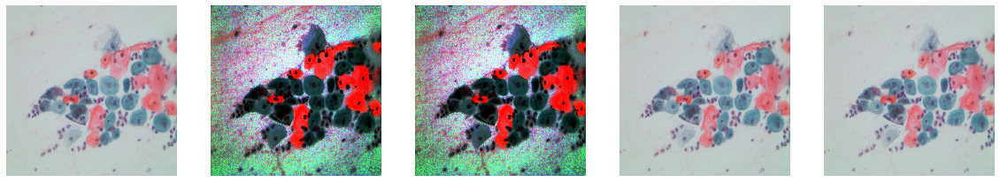

In [266]:
pipeline = Augmentor.Pipeline(data_path)
pipeline.histogram_equalisation(.7)

aug_img = get_aug_image(pipeline)
compare_augment(orig_img, aug_img)

## Add Cells

In [5]:
import numpy as np

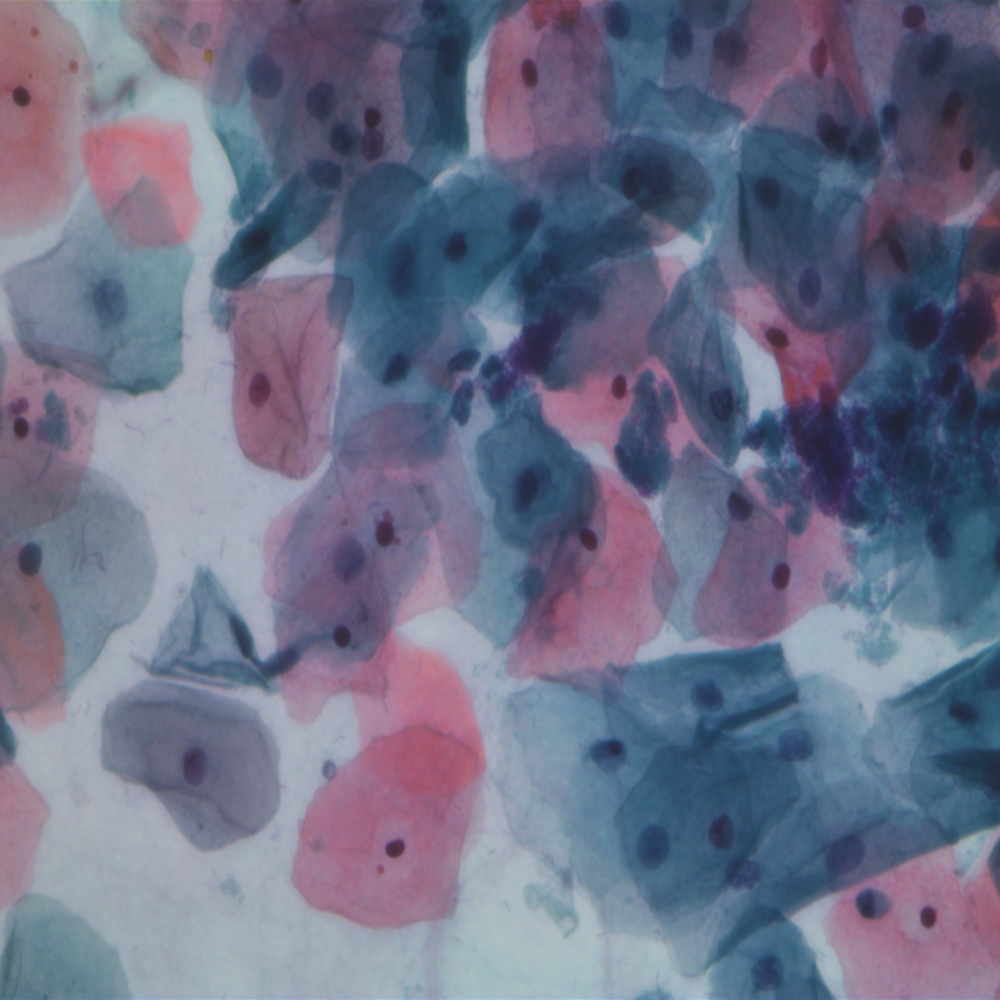

In [6]:
img

In [36]:
new_img = randomly_insert_cells(np.array(img))
show_image(new_img)

ValueError: could not broadcast input array from shape (139,168) into shape (115,168)

#### 

In [227]:
import numpy as np

from cancer.utils import add_cell, read_bmp
from cancer.datasets import get_sipakmed
from cancer.variables import ABNORMAL_CELL_TYPES_SIP

In [9]:
pipeline = Augmentor.Pipeline(data_path)


Initialised with 1 image(s) found.
Output directory set to /Users/seanwade/projects/cancerDetection/data/../notebooks/resources/output.

In [221]:
dataset = get_sipakmed()

In [ ]:

pipeline.

In [ ]:
pipeline.histogram_equalisation

In [247]:
np.random.randint(0,num_cells)

0

In [250]:
num_cells = len(dataset[ABNORMAL_CELL_TYPES_SIP[0]]['imgs'])
indx = np.random.randint(0, num_cells)
aug_cell_path = dataset[ABNORMAL_CELL_TYPES_SIP[0]]['imgs'][indx]
cell_poly = dataset[ABNORMAL_CELL_TYPES_SIP[0]]['cytos'][indx][0]

cell_img = read_bmp(aug_cell_path)
offset = (100, 100)

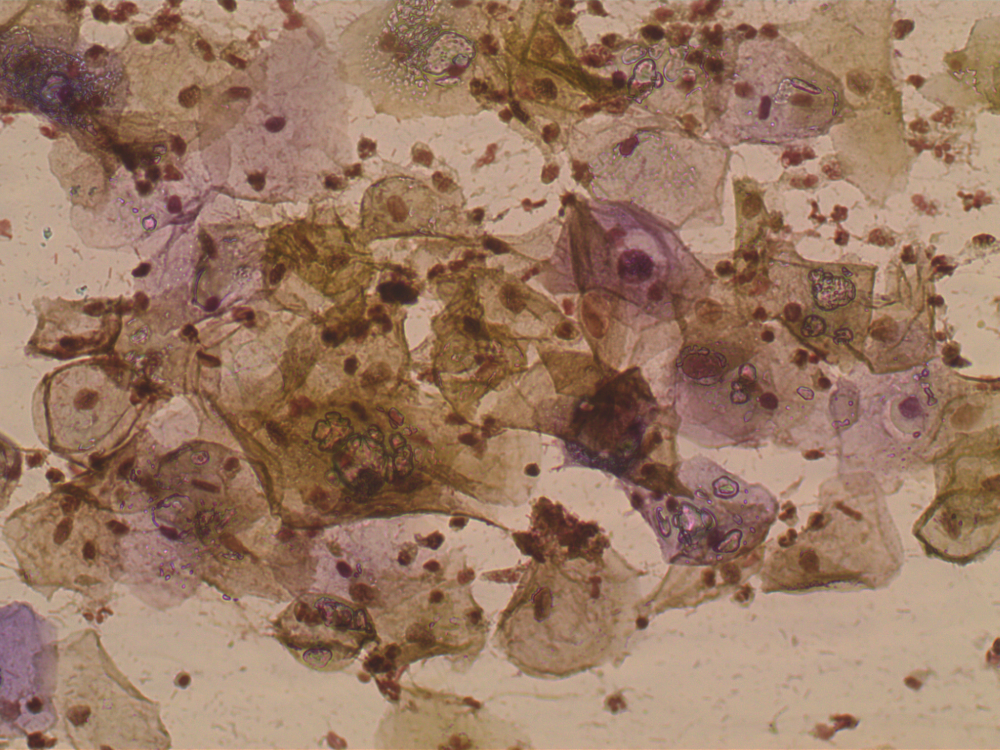

In [254]:
show_image(cell_img)

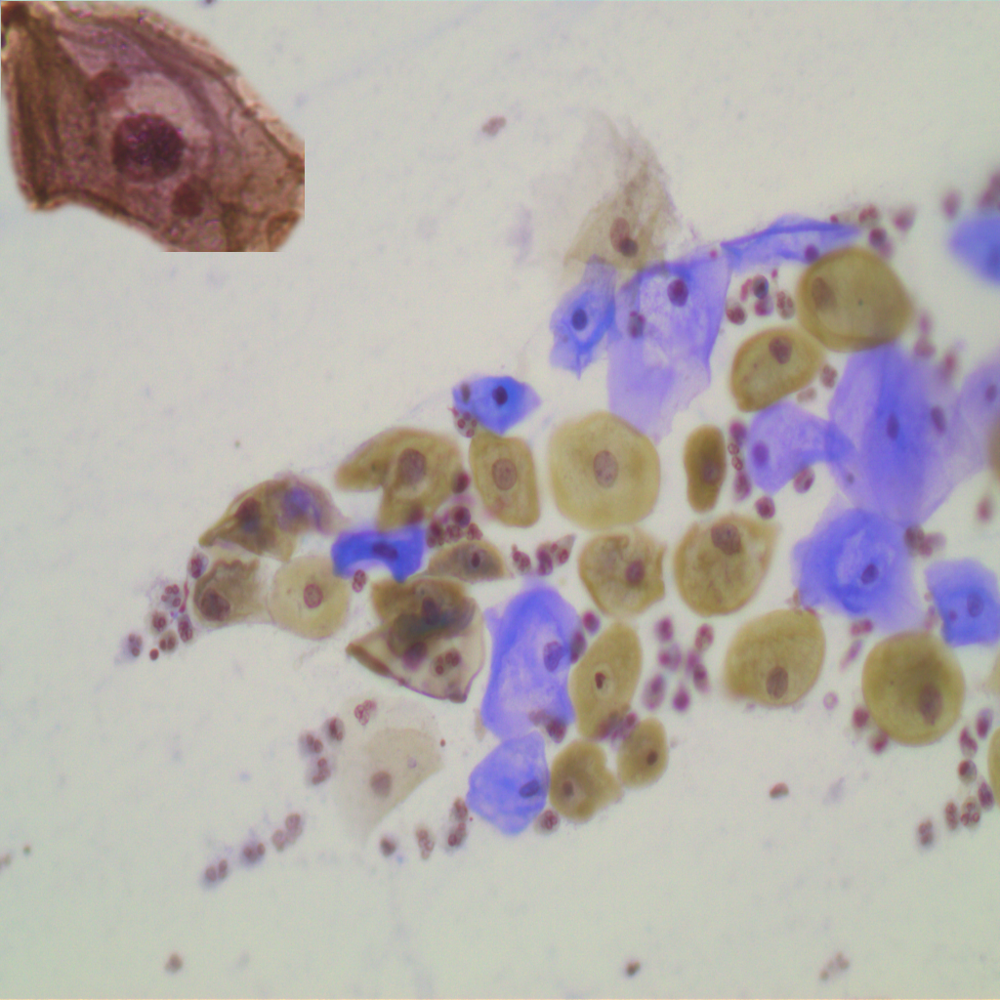

In [257]:
new_img = add_cell(orig_img, cell_img, cell_poly, (1,1), b=0)
show_image(new_img)